<img src="https://github.com/hernancontigiani/ceia_memorias_especializacion/raw/master/Figures/logoFIUBA.jpg" width="500" align="center">


# Procesamiento de lenguaje natural
## Sentiment analysis con Embeddings + LSTM

## Alumna: María Carina Roldán

### Objetivo
El objetivo es utilizar las críticas de compradores de ropa para que el sistema determine la evaluación del comprador y su crítica (cuántas estrellas le asigna al producto).

In [ ]:
!pip install --upgrade --no-cache-dir gdown --quiet

In [ ]:
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
import numpy as np
import io
import pickle
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
from tensorflow import keras

from keras.utils import pad_sequences
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Embedding
from keras.layers import Dropout

from keras.preprocessing.text import text_to_word_sequence
from keras.preprocessing.text import Tokenizer

from sklearn.model_selection import train_test_split

### Datos
Utilizaremos como dataset críticas de compradores de ropa (eCommerce) los cuales puntuaron a cada prenda con un puntaje de 1 a 5 estrellas.\
Referencia del dataset: [LINK](https://www.kaggle.com/nicapotato/womens-ecommerce-clothing-reviews/version/1)

In [ ]:
# Descargar la carpeta de dataset
import os
import gdown
if os.access('clothing_ecommerce_reviews.csv', os.F_OK) is False:
    url = 'https://drive.google.com/uc?id=1Urn1UFSrodN5BuW6-sc_igtaySGRwhV8'
    output = 'clothing_ecommerce_reviews.csv'
    gdown.download(url, output, quiet=False)
else:
    print("El dataset ya se encuentra descargado")

Downloading...
From: https://drive.google.com/uc?id=1Urn1UFSrodN5BuW6-sc_igtaySGRwhV8
To: /content/clothing_ecommerce_reviews.csv
100%|██████████| 8.48M/8.48M [00:00<00:00, 33.6MB/s]


In [ ]:
# Armar el dataset
df = pd.read_csv('clothing_ecommerce_reviews.csv')
df.drop(columns = ['Unnamed: 0'], inplace = True)
df.head()

,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses


### 1 - Limpieza de datos
Alumno:
- Del dataset unicamente utilizar las columnas "Review Text" y "Rating.
- Tranformar el rating 1-5 a una escala numérica de 0 a 4.



In [ ]:
df_reviews = df.loc[:, ['Review Text', 'Rating']].dropna()
df_reviews['Rating'] = df_reviews['Rating'] - 1
df_reviews.head()

,Review Text,Rating
0,Absolutely wonderful - silky and sexy and comf...,3
1,Love this dress! it's sooo pretty. i happene...,4
2,I had such high hopes for this dress and reall...,2
3,"I love, love, love this jumpsuit. it's fun, fl...",4
4,This shirt is very flattering to all due to th...,4


In [ ]:
# Alumno: Observar como está distribuido el dataset respecto a la columna Rating
# es decir, observar que tan balanceado se encuentra respecto a cada clase

In [ ]:
df_reviews['Rating'].value_counts()

4    12540
3     4908
2     2823
1     1549
0      821
Name: Rating, dtype: int64

Las clases están muy desbalanceadas. La que más datos tiene (4) tiene 15 veces más que la que menos tiene (0).

### Balanceo las clases con upsampling

Subo la cardinalidad de todas para que se igualen a la clase 4.


In [ ]:
from sklearn.utils import resample

# Separo las clases
df_0 = df_reviews[df_reviews.Rating==0]
df_1 = df_reviews[df_reviews.Rating==1]
df_2 = df_reviews[df_reviews.Rating==2]
df_3 = df_reviews[df_reviews.Rating==3]
df_4 = df_reviews[df_reviews.Rating==4]
 
# upsample
df_0_up = resample(df_0, replace=True, n_samples=12540, random_state=123)
df_1_up = resample(df_1, replace=True, n_samples=12540, random_state=123)
df_2_up = resample(df_2, replace=True, n_samples=12540, random_state=123)
df_3_up = resample(df_3, replace=True, n_samples=12540, random_state=123)
 
# Combino las clases upsampled con la clase 4 sin modificar
df_upsampled = pd.concat([df_0_up, df_1_up, df_2_up, df_3_up, df_4])
 
# Nuevos valores
df_upsampled['Rating'].value_counts()

0    12540
1    12540
2    12540
3    12540
4    12540
Name: Rating, dtype: int64

In [ ]:
# Alumno: tomar la columna de las review y almacenarlo todo en un vector numpy de reviews
np_reviews = np.array(df_upsampled['Review Text']) # datos balanceados
np_reviews

array(["Did not work for me. whatsoever. the stripes were adorable but the piece just didn't fit like on the model. the collar was practically choking me and the tie just didn't make my figure look the way it normally does. aka i looked frumpy and chunky, which i'm not. going back.",
       'Very poorly made- wide and short, very unflattering. the material is advertised as cotton, but it felt very synthetic.',
       'I opened these when i got them yesterday and immediately tried them on. the knees were totally stretched out and due to the panel at the knee, it looked like i had growths popping out between my legs at my knees. someone had received these before me and sent them back after they tried them on or wore them then returned them. they were obviously too small for whoever did that. these never should have been resent to another customer. they are obviously very misshapen. they are going back. on a bet',
       ...,
       'So i wasn\'t sure about ordering this skirt because i c

In [ ]:
# Alumno: Cuantas reviews (rows) hay para evaluar?
len(np_reviews)

62700

In [ ]:
# Alumno: Concatenar todas las reviews para armar el corpus
corpus = ' '.join(np_reviews)
corpus

'Did not work for me. whatsoever. the stripes were adorable but the piece just didn\'t fit like on the model. the collar was practically choking me and the tie just didn\'t make my figure look the way it normally does. aka i looked frumpy and chunky, which i\'m not. going back. Very poorly made- wide and short, very unflattering. the material is advertised as cotton, but it felt very synthetic. I opened these when i got them yesterday and immediately tried them on. the knees were totally stretched out and due to the panel at the knee, it looked like i had growths popping out between my legs at my knees. someone had received these before me and sent them back after they tried them on or wore them then returned them. they were obviously too small for whoever did that. these never should have been resent to another customer. they are obviously very misshapen. they are going back. on a bet I loved this dress online and was luckily able to locate it in a store about an hour away from me. i 

In [ ]:
# Alumno: ¿Cuál es la longitud de ese corpus?
len(corpus)

19776839

Separo las palabras en tokens y elimino las stopwords.

In [ ]:
# Alumno: Utilizar "text_to_word_sequence" para separar las palabras en tokens
# recordar que text_to_word_sequence automaticamente quita los signos de puntuacion y pasa el texto a lowercase

# tokens de corpus original
# tokens = text_to_word_sequence(corpus)

# tokens sin stopwords
tokens_tmp = text_to_word_sequence(corpus)
nltk_stop_words = set(stopwords.words("english"))
tokens = np.array([w for w in tokens_tmp if w not in nltk_stop_words])

In [ ]:
# Alumno: Dar un vistazo a los primeros 20 tokens/palabras
tokens[:20]

array(['work', 'whatsoever', 'stripes', 'adorable', 'piece', 'fit',
       'like', 'model', 'collar', 'practically', 'choking', 'tie', 'make',
       'figure', 'look', 'way', 'normally', 'aka', 'looked', 'frumpy'],
      dtype='<U33')

In [ ]:
# Alumno: ¿Cuántos tokens/palabras hay?
len(tokens)

1870964

In [ ]:
# Alumno: Tokenizar las palabras con el Tokenizer de Keras
# Definir una máxima cantidad de palabras a utilizar:
# num_words --> the maximum number of words to keep, based on word frequency.
# Only the most common num_words-1 words will be kept.

num_words = 2000
vocab_size = num_words

tok = Tokenizer(num_words=2000) 
tok.fit_on_texts(tokens)

In [ ]:
# Alumno: Obtener el diccionario de palabra (word) a índice
# y observar la cantidad total del vocabulario
word_index = tok.word_index
len(word_index)

14551

In [ ]:
# Alumno: Convertir las palabras/tokens a números
sequences = tok.texts_to_sequences(np_reviews)

In [ ]:
# Alumno: Determinar cual es la oración más larga
max(len(s) for s in sequences)

63

In [ ]:
# Alumno: Realizar padding de las sentencias al mismo tamaño
# tomando de referencia la máxima sentencia
maxlen = 63
X = pad_sequences(sequences, padding='pre', maxlen=maxlen)

In [ ]:
# Alumno: Observar las dimensiones de la variable input
X.shape

(62700, 63)

In [ ]:
# Alumno tomar la columna rating y alcemacenarla en una variable "y" transformada a oneHotEncoding
# Su shape debe ser equivalente la cantidad de rows del corpus y a la cantidad
# de clases que se deseen predecir (en este ejemplo son 5)

y = df_upsampled['Rating'].values # la columna de los datos upsampled
y = pd.get_dummies(y)
print(y.shape)

(62700, 5)


In [ ]:
# Alumno: Dividir los datos en train y test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Alumno: determinar la dimensiones de entrada y salida
in_shape = X_train.shape[1] # max input sentence len
out_shape = 5 # multiclass
print("in_shape", in_shape, ", out_shape", out_shape)

in_shape 63 , out_shape 5


### 2 - Entrenar el modelo con Embeddings + LSTM

In [ ]:
# Alumno: Entrene su modelo con LSTM entrenando sus propios embeddings
# o utilizando embeddings pre-entrenados.

model = Sequential()
# input_dim = vocab_size (max n_words)
# input_length = sentencias con padding a 200
# output_dim = 50 --> crear embeddings de tamaño 50
model.add(Embedding(input_dim=vocab_size+1, output_dim=50, input_length=in_shape))
model.add(LSTM(units=64, return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(units=64)) # La última capa LSTM no lleva return_sequences
model.add(Dense(units=128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(units=out_shape, activation='softmax')) # uso softmax para multiclase

model.compile(optimizer="adam",
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 63, 50)            100050    
                                                                 
 lstm (LSTM)                 (None, 63, 64)            29440     
                                                                 
 dropout (Dropout)           (None, 63, 64)            0         
                                                                 
 lstm_1 (LSTM)               (None, 64)                33024     
                                                                 
 dense (Dense)               (None, 128)               8320      
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 5)                 6

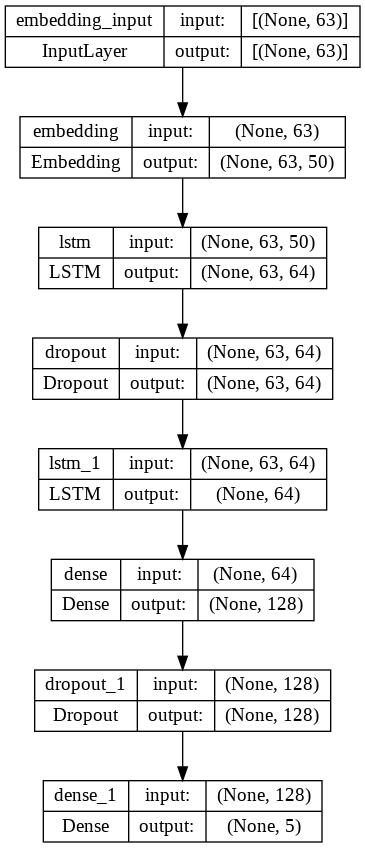

In [ ]:
from keras.utils.vis_utils import plot_model
plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

In [ ]:
hist = model.fit(X_train, y_train, epochs=100, validation_split=0.2)

Epoch 1/100
1254/1254 [==============================] - 21s 10ms/step - loss: 1.1038 - accuracy: 0.5044 - val_loss: 0.9051 - val_accuracy: 0.6085
Epoch 2/100
1254/1254 [==============================] - 13s 11ms/step - loss: 0.8067 - accuracy: 0.6613 - val_loss: 0.7461 - val_accuracy: 0.6862
Epoch 3/100
1254/1254 [==============================] - 13s 11ms/step - loss: 0.6603 - accuracy: 0.7331 - val_loss: 0.6676 - val_accuracy: 0.7325
Epoch 4/100
1254/1254 [==============================] - 14s 11ms/step - loss: 0.5535 - accuracy: 0.7805 - val_loss: 0.5541 - val_accuracy: 0.7886
Epoch 5/100
1254/1254 [==============================] - 12s 10ms/step - loss: 0.4774 - accuracy: 0.8144 - val_loss: 0.5362 - val_accuracy: 0.8008
Epoch 6/100
1254/1254 [==============================] - 12s 10ms/step - loss: 0.4207 - accuracy: 0.8365 - val_loss: 0.4999 - val_accuracy: 0.8203
Epoch 7/100
1254/1254 [==============================] - 13s 10ms/step - loss: 0.3688 - accuracy: 0.8587 - val_loss: 0

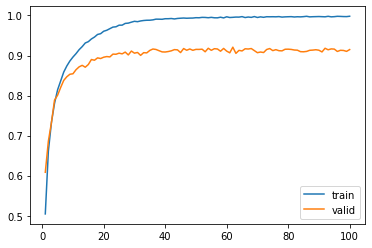

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
epoch_count = range(1, len(hist.history['accuracy']) + 1)
sns.lineplot(x=epoch_count,  y=hist.history['accuracy'], label='train')
sns.lineplot(x=epoch_count,  y=hist.history['val_accuracy'], label='valid')
plt.show()

Se observa que el accuracy fue alto.
Sube muy rápido y después de las 30 epochs se mantiene estable.

In [ ]:
model.evaluate(X_test, y_test)

392/392 [==============================] - 2s 5ms/step - loss: 0.9615 - accuracy: 0.9059


[0.9614940285682678, 0.9059011340141296]

En testing se confirma que el modelo entrenado presenta buenos resultados.

### 3 - Entrenar el modelo con Embeddings Fasttext + LSTM

In [ ]:
# Descargar los embeddings desde un google drive
# NOTA: En caso de que no estén disponibles descargar de la página oficial
import os
import gdown
if os.access('fasttext.pkl', os.F_OK) is False:
    url = 'https://drive.google.com/uc?id=1Qi1r-u5lsEsNqRSxLrpNOqQ3B_ufltCa&export=download'
    output = 'fasttext.pkl'
    gdown.download(url, output, quiet=False)
else:
    print("Los embeddings fasttext.pkl ya están descargados")

Downloading...
From: https://drive.google.com/uc?id=1Qi1r-u5lsEsNqRSxLrpNOqQ3B_ufltCa&export=download
To: /content/fasttext.pkl
100%|██████████| 2.88G/2.88G [00:43<00:00, 66.9MB/s]


In [ ]:
# !curl -L -o 'fasttext.pkl' 'https://drive.google.com/u/0/uc?id=1Qi1r-u5lsEsNqRSxLrpNOqQ3B_ufltCa&export=download&confirm=t'

In [ ]:
import logging
import os
from pathlib import Path
from io import StringIO
import pickle

class WordsEmbeddings(object):
    logger = logging.getLogger(__name__)

    def __init__(self):
        # load the embeddings
        words_embedding_pkl = Path(self.PKL_PATH)
        if not words_embedding_pkl.is_file():
            words_embedding_txt = Path(self.WORD_TO_VEC_MODEL_TXT_PATH)
            assert words_embedding_txt.is_file(), 'Words embedding not available'
            embeddings = self.convert_model_to_pickle()
        else:
            embeddings = self.load_model_from_pickle()
        self.embeddings = embeddings
        # build the vocabulary hashmap
        index = np.arange(self.embeddings.shape[0])
        # Diccionarios para traducir de embedding a IDX de la palabra
        self.word2idx = dict(zip(self.embeddings['word'], index))
        self.idx2word = dict(zip(index, self.embeddings['word']))

    def get_words_embeddings(self, words):
        words_idxs = self.words2idxs(words)
        return self.embeddings[words_idxs]['embedding']

    def words2idxs(self, words):
        return np.array([self.word2idx.get(word, -1) for word in words])

    def idxs2words(self, idxs):
        return np.array([self.idx2word.get(idx, '-1') for idx in idxs])

    def load_model_from_pickle(self):
        self.logger.debug(
            'loading words embeddings from pickle {}'.format(
                self.PKL_PATH
            )
        )
        max_bytes = 2**28 - 1 # 256MB
        bytes_in = bytearray(0)
        input_size = os.path.getsize(self.PKL_PATH)
        with open(self.PKL_PATH, 'rb') as f_in:
            for _ in range(0, input_size, max_bytes):
                bytes_in += f_in.read(max_bytes)
        embeddings = pickle.loads(bytes_in)
        self.logger.debug('words embeddings loaded')
        return embeddings

    def convert_model_to_pickle(self):
        self.logger.debug(
            'converting and loading words embeddings from text file {}'.format(
                self.WORD_TO_VEC_MODEL_TXT_PATH
            )
        )
        structure = [('word', np.dtype('U' + str(self.WORD_MAX_SIZE))),
                     ('embedding', np.float32, (self.N_FEATURES,))]
        structure = np.dtype(structure)
        # load numpy array from disk using a generator
        with open(self.WORD_TO_VEC_MODEL_TXT_PATH, encoding="utf8") as words_embeddings_txt:
            embeddings_gen = (
                (line.split()[0], line.split()[1:]) for line in words_embeddings_txt
                if len(line.split()[1:]) == self.N_FEATURES
            )
            embeddings = np.fromiter(embeddings_gen, structure)
        # add a null embedding
        null_embedding = np.array(
            [('null_embedding', np.zeros((self.N_FEATURES,), dtype=np.float32))],
            dtype=structure
        )
        embeddings = np.concatenate([embeddings, null_embedding])
        # dump numpy array to disk using pickle
        max_bytes = 2**28 - 1 # # 256MB
        bytes_out = pickle.dumps(embeddings, protocol=pickle.HIGHEST_PROTOCOL)
        with open(self.PKL_PATH, 'wb') as f_out:
            for idx in range(0, len(bytes_out), max_bytes):
                f_out.write(bytes_out[idx:idx+max_bytes])
        self.logger.debug('words embeddings loaded')
        return embeddings


class GloveEmbeddings(WordsEmbeddings):
    WORD_TO_VEC_MODEL_TXT_PATH = 'glove.twitter.27B.50d.txt'
    PKL_PATH = 'gloveembedding.pkl'
    N_FEATURES = 50
    WORD_MAX_SIZE = 60


class FasttextEmbeddings(WordsEmbeddings):
    WORD_TO_VEC_MODEL_TXT_PATH = 'cc.en.300.vec'
    PKL_PATH = 'fasttext.pkl'
    N_FEATURES = 300
    WORD_MAX_SIZE = 60

In [ ]:
model_fasttext = FasttextEmbeddings()

In [ ]:
# Crear la Embedding matrix para la cantidad nb_words seleccionadas
# nos vamos a quedar sólo con los vectores de embeddings para las palabras
# que definimos como vocabulario

print('preparing embedding matrix...')
embed_dim = 300 # fasttext
words_not_found = []

# word_index proviene del tokenizer

nb_words = min(num_words, len(word_index)) # vocab_size
embedding_matrix = np.zeros((nb_words, embed_dim))

for word, i in word_index.items():
    if i >= nb_words:
        continue
    embedding_vector = model_fasttext.get_words_embeddings(word)[0]
    if (embedding_vector is not None) and len(embedding_vector) > 0:
        embedding_matrix[i] = embedding_vector
    else:
        # words que no estén en el índice de la matriz de embedding tendrán
        # como vector de embedding correspondiente todos ceros
        words_not_found.append(word)
        print(word)

print('number of null word embeddings:', np.sum(np.sum(embedding_matrix**2, axis=1) == 0))

preparing embedding matrix...
number of null word embeddings: 2


In [ ]:
# Definimos el modelo

from keras.layers import Bidirectional

model2 = Sequential()
# input_dim = vocab_size (max n_words)
# input_length = sentencias con padding a 200
# output_dim = embed_dim (depende que embeddings pre entrenados utilizamos)
model2.add(Embedding(input_dim=vocab_size, # definido en el Tokenizador
                     output_dim=embed_dim, # dimensión de los embeddings utilizados
                     input_length=in_shape, # máxima sentencia de entrada
                     weights=[embedding_matrix], # matrix de embeddings
                    trainable=False)) # marcar como layer no entrenable


model2.add(LSTM(units=64, return_sequences=True))
model2.add(Dropout(0.2))
model2.add(LSTM(units=64)) # La última capa LSTM no lleva return_sequences
model2.add(Dense(units=128, activation='relu'))
model2.add(Dropout(0.5))
model2.add(Dense(units=out_shape, activation='softmax'))

model2.compile(optimizer="adam",
              loss='categorical_crossentropy',
              metrics=['accuracy'])

model2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 63, 300)           600000    
                                                                 
 lstm_2 (LSTM)               (None, 63, 64)            93440     
                                                                 
 dropout_2 (Dropout)         (None, 63, 64)            0         
                                                                 
 lstm_3 (LSTM)               (None, 64)                33024     
                                                                 
 dense_2 (Dense)             (None, 128)               8320      
                                                                 
 dropout_3 (Dropout)         (None, 128)               0         
                                                                 
 dense_3 (Dense)             (None, 5)                

In [ ]:
hist2 = model2.fit(X_train, y_train, epochs=100, validation_split=0.2)

Epoch 1/100
1254/1254 [==============================] - 18s 11ms/step - loss: 1.5590 - accuracy: 0.2728 - val_loss: 1.5121 - val_accuracy: 0.3019
Epoch 2/100
1254/1254 [==============================] - 15s 12ms/step - loss: 1.4819 - accuracy: 0.3363 - val_loss: 1.4436 - val_accuracy: 0.3590
Epoch 3/100
1254/1254 [==============================] - 15s 12ms/step - loss: 1.3415 - accuracy: 0.4151 - val_loss: 1.2378 - val_accuracy: 0.4673
Epoch 4/100
1254/1254 [==============================] - 13s 10ms/step - loss: 1.1429 - accuracy: 0.5029 - val_loss: 1.0769 - val_accuracy: 0.5331
Epoch 5/100
1254/1254 [==============================] - 12s 10ms/step - loss: 1.0020 - accuracy: 0.5636 - val_loss: 0.9425 - val_accuracy: 0.5927
Epoch 6/100
1254/1254 [==============================] - 12s 9ms/step - loss: 0.9054 - accuracy: 0.6066 - val_loss: 0.8695 - val_accuracy: 0.6278
Epoch 7/100
1254/1254 [==============================] - 14s 11ms/step - loss: 0.8236 - accuracy: 0.6438 - val_loss: 0.

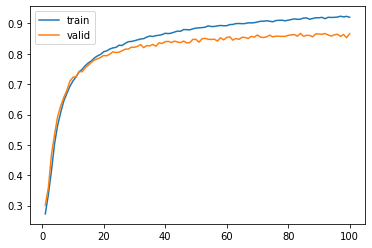

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
epoch_count = range(1, len(hist2.history['accuracy']) + 1)
sns.lineplot(x=epoch_count,  y=hist2.history['accuracy'], label='train')
sns.lineplot(x=epoch_count,  y=hist2.history['val_accuracy'], label='valid')
plt.show()

Los números son algo mas bajos que en el modelo anterior, pero igualmente son muy buenos.

In [ ]:
model2.evaluate(X_test, y_test)

392/392 [==============================] - 2s 5ms/step - loss: 0.5488 - accuracy: 0.8602


[0.5488253831863403, 0.8602073192596436]

### 4 - Resumen y conclusiones

Lo primero que se hizo antes de entrenar fue un downsampling para balancear las clases. A partir de ahí se realizaron diferentes pruebas:
- Con y sin stopwords
- Complejizando el modelo con más capas
- Complejizando el modelo con más neuronas

En la mayoría de los casos el resultado fue malo. El overfitting era altísimo y el accuracy en validación apenas llegaba a 0.5 en el modelo 1 (sin embeddings pre-entrenados), y a 0.4 en el modelo 2 (con Fasttext).

Se decidió cambiar la estrategia y hace upsampling aumentando el número de todas las clases para que coincidan con el número de la clase mayoritaria. Dejando un modelo simple y sin incluir stopwords, los resultados cambiaron dramáticamente. Esos son los que finalmente quedaron reflejados en la notebook.

En cualquiera de los casos (antes y despues de hacer el upsampling) los resultados siempre fueron mejores para el modelo sin embeddings pre-entrenados que para el modelo con Fasttext.